In [603]:
!nvidia-smi

Sun May 11 11:14:51 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 555.52.04              Driver Version: 555.52.04      CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 2080 Ti     Off |   00000000:1F:00.0 Off |                  N/A |
| 30%   24C    P8              3W /  250W |    2089MiB /  11264MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [148]:
%matplotlib inline
# Install Kaggle CLI
!pip install kaggle --quiet

In [7]:


import sys
import os
import shutil
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
import torch
from torch.utils.data import Dataset
import torchvision.transforms as T
import torchxrayvision as xrv
import random
import copy

In [ ]:
# Initial loading of dataset from kaggle

# Set the name of the subfolder where you uploaded your kaggle.json
uploaded_folder = '.'

# Paths
uploaded_kaggle_path = os.path.join(uploaded_folder, 'kaggle.json')
kaggle_dir = os.path.expanduser('~/.kaggle')
kaggle_json_target = os.path.join(kaggle_dir, 'kaggle.json')

# Create .kaggle directory if it doesn't exist
os.makedirs(kaggle_dir, exist_ok=True)

# Move (copy) the uploaded kaggle.json securely
if os.path.exists(uploaded_kaggle_path):
    shutil.copy(uploaded_kaggle_path, kaggle_json_target)  # Use copy to avoid cross-device issues
    os.chmod(kaggle_json_target, 0o600)
    print("Kaggle API token copied and secured.")
else:
    raise FileNotFoundError(f"kaggle.json not found at {uploaded_kaggle_path}. Please check your upload.")

# Step 4: Download the dataset
dataset_dir = os.path.expanduser('~/datasets/rsna-pneumonia')
os.makedirs(dataset_dir, exist_ok=True)

print("Downloading the dataset...")
!kaggle competitions download -c rsna-pneumonia-detection-challenge -p {dataset_dir}

print("Download complete!")

# Step 5: Remove the Kaggle token immediately after download
try:
    os.remove(kaggle_json_target)
    print("Kaggle API token removed from server.")
except FileNotFoundError:
    print("No kaggle.json found to remove — maybe already cleaned up.")


In [ ]:
# unzip the downloaded file
import zipfile
import os

dataset_dir ='./datasets/rsna-pneumonia'
zip_path = os.path.join(dataset_dir, 'rsna-pneumonia-detection-challenge.zip')

if os.path.exists(zip_path):
    print("Unzipping main rsna-pneumonia-detection-challenge.zip...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(dataset_dir)
    print("Main archive extracted!")
else:
    print("No zip file found!")

In [ ]:
#  Unzip all zip-files
import zipfile
import glob

dataset_dir = './datasets/rsna-pneumonia/'

# Find all .zip files
zip_files = glob.glob(os.path.join(dataset_dir, '*.zip'))

# Unzip each one
for zip_path in zip_files:
    print(f"Unzipping {os.path.basename(zip_path)}...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(dataset_dir)
    print(f"{os.path.basename(zip_path)} extracted.")

print("All ZIP files have been extracted.")

In [5]:
import pandas as pd
import os

# Set the path to the labels file
dataset_dir = './datasets/rsna-pneumonia'  # Your corrected dataset path
labels_path = os.path.join(dataset_dir, 'stage_2_train_labels.csv')

# Load the CSV into a DataFrame
df_labels = pd.read_csv(labels_path)

# Show basic info
print("Labels loaded successfully!")
print(df_labels.head())



✅ Labels loaded successfully!
                              patientId      x      y  width  height  Target
0  0004cfab-14fd-4e49-80ba-63a80b6bddd6    NaN    NaN    NaN     NaN       0
1  00313ee0-9eaa-42f4-b0ab-c148ed3241cd    NaN    NaN    NaN     NaN       0
2  00322d4d-1c29-4943-afc9-b6754be640eb    NaN    NaN    NaN     NaN       0
3  003d8fa0-6bf1-40ed-b54c-ac657f8495c5    NaN    NaN    NaN     NaN       0
4  00436515-870c-4b36-a041-de91049b9ab4  264.0  152.0  213.0   379.0       1


In [6]:
# Paths
dataset_dir = './datasets/rsna-pneumonia'
images_dir = os.path.join(dataset_dir, 'stage_2_train_images')  # folder where DICOM images are
labels_path = os.path.join(dataset_dir, 'stage_2_train_labels.csv')

In [4]:
# If df_full is already saved, load it
df_full = pd.read_csv('datasets/rsna-pneumonia/masks/df_full.csv')

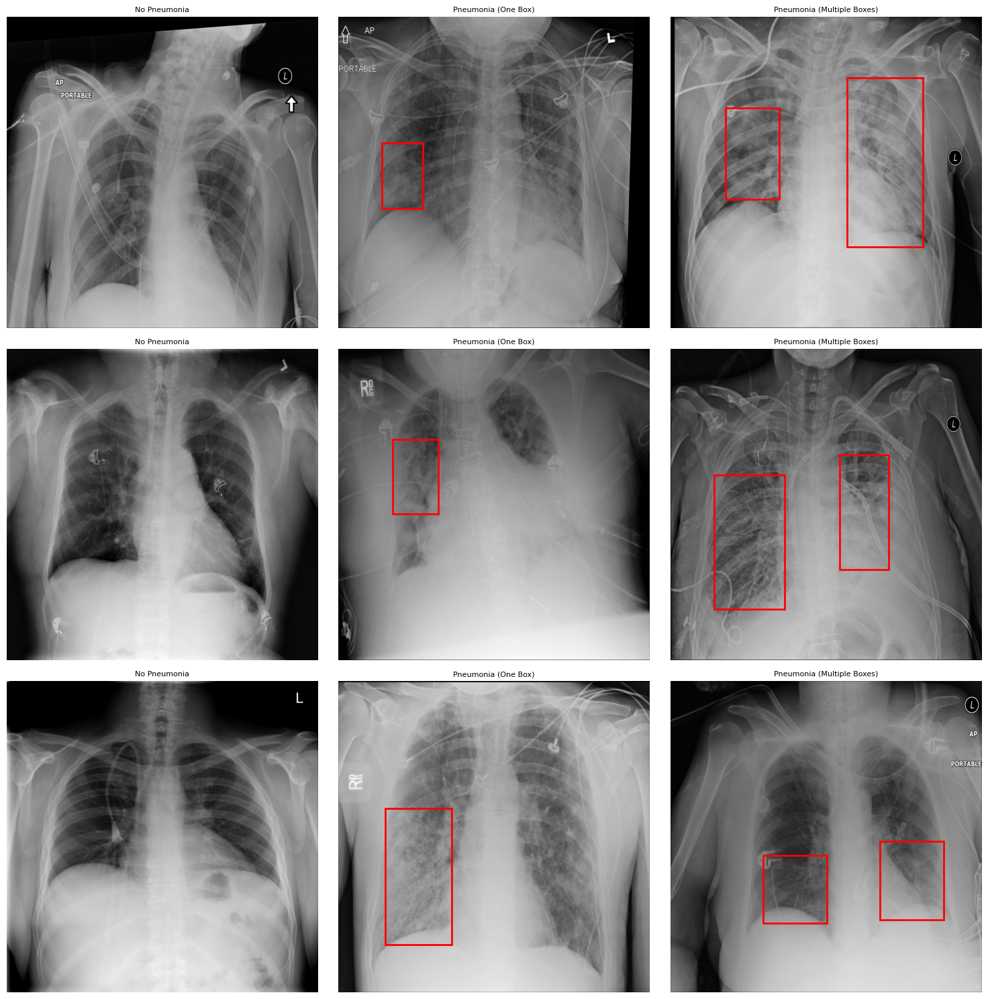

In [8]:
# This code plots three rows of patient images with each row having one non-pneumonia, one pneumonia
# with one bbox, and one pneumonia with multiple bounding boxes, to make sure that everything is correct.
# Prepare categories
no_pneumonia_patients = df_labels[df_labels['Target'] == 0]['patientId'].unique()

# Pneumonia cases
pneumonia_cases = df_labels[df_labels['Target'] == 1]

# Patients with exactly one bbox
one_bbox_patients = (pneumonia_cases
                     .groupby('patientId')
                     .size()
                     .reset_index(name='n_bboxes'))
one_bbox_patients = one_bbox_patients[one_bbox_patients['n_bboxes'] == 1]['patientId'].values

# Patients with multiple bboxes
multi_bbox_patients = (pneumonia_cases
                       .groupby('patientId')
                       .size()
                       .reset_index(name='n_bboxes'))
multi_bbox_patients = multi_bbox_patients[multi_bbox_patients['n_bboxes'] > 1]['patientId'].values

# Helper function to get bounding boxes for a patient
def get_bboxes(patient_id):
    return pneumonia_cases[pneumonia_cases['patientId'] == patient_id][['x', 'y', 'width', 'height']].values

# Helper function to plot a patient
def plot_patient(ax, patient_id, title):
    dcm_path = os.path.join(images_dir, f"{patient_id}.dcm")
    dcm_data = pydicom.dcmread(dcm_path)
    image = dcm_data.pixel_array
    ax.imshow(image, cmap='gray')
    
    # Plot bounding boxes if pneumonia
    patient_labels = df_labels[df_labels['patientId'] == patient_id]
    if patient_labels['Target'].any():  # if any Target == 1
        bboxes = get_bboxes(patient_id)
        for (x, y, w, h) in bboxes:
            rect = plt.Rectangle((x, y), w, h, edgecolor='red', facecolor='none', linewidth=2)
            ax.add_patch(rect)
    
    ax.set_title(title, fontsize=8)
    ax.axis('off')

# Plotting 3x3 grid
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for row in range(3):
    # Select one random patient from each category
    no_pneu_patient = pd.Series(no_pneumonia_patients).sample(1).values[0]
    one_bbox_patient = pd.Series(one_bbox_patients).sample(1).values[0]
    multi_bbox_patient = pd.Series(multi_bbox_patients).sample(1).values[0]
    
    # Plot in the corresponding columns
    plot_patient(axes[row, 0], no_pneu_patient, "No Pneumonia")
    plot_patient(axes[row, 1], one_bbox_patient, "Pneumonia (One Box)")
    plot_patient(axes[row, 2], multi_bbox_patient, "Pneumonia (Multiple Boxes)")

plt.tight_layout()
plt.show()

In [377]:
# change pixel spacing from pydicom multivalue to tuples to make them hashable
def to_hashable(x):
    if isinstance(x, (list, np.ndarray, pydicom.multival.MultiValue)):
        return tuple(x)
    else:
        return x
df_full['PixelSpacing'] = df_full['PixelSpacing'].apply(to_hashable)

In [379]:
# This code goes through all present dicom tags to see 1) if there are value 2) if there are multiple values
# Function to summarize a dataframe
def summarize_columns(df, columns=None):
    if columns is None:
        columns = df.columns  # All columns

    summary = {}
    for col in columns:
        value_series = df[col]

        # Convert list-like entries to tuples for hashability
        if value_series.apply(lambda x: isinstance(x, list)).any():
            value_series = value_series.apply(lambda x: tuple(x) if isinstance(x, list) else x)

        try:
            unique_values = value_series.nunique(dropna=True)
            all_same = (unique_values == 1)
        except TypeError:
            unique_values = 'unhashable'
            all_same = False

        missing_count = df[col].isnull().sum()
        all_nan = df[col].isnull().all()

        summary[col] = {
            'Unique Values': unique_values,
            'Missing Values': missing_count,
            'All Missing': all_nan,
            'All Same Value': all_same
        }
    return pd.DataFrame(summary).T
# Columns you care about
cols_to_check = ['PatientAge', 'PatientSex', 'ViewPosition', 'PatientOrientation', 'Target']

# Run the summary
column_summary = summarize_columns(df_full)

# Print
print(column_summary)

                            Unique Values Missing Values All Missing  \
patientId                           26684              0       False   
SpecificCharacterSet                    1              0       False   
SOPClassUID                             1              0       False   
SOPInstanceUID                      26684              0       False   
StudyDate                               1              0       False   
StudyTime                               1              0       False   
AccessionNumber                         0          26684        True   
Modality                                1              0       False   
ConversionType                          1              0       False   
ReferringPhysiciansName                 0          26684        True   
SeriesDescription                       2              0       False   
PatientName                         26684              0       False   
PatientID                           26684              0       F

In [382]:
# show the different pixel-spacing present in the dataset
pixelspacing_counts = df_full['PixelSpacing'].dropna().value_counts()

# Print nicely
print(f"Found {len(pixelspacing_counts)} unique PixelSpacing values.\n")
for spacing, count in pixelspacing_counts.items():
    print(f"Pixel Spacing {spacing}: {count} examples")

[('0.171', '0.171') ('0.19431099999999998', '0.19431099999999998')
 ('0.139', '0.139') ('0.14300000000000002', '0.14300000000000002')
 ('0.168', '0.168') ('0.115', '0.115')
 ('0.19431400000000001', '0.19431400000000001')
 ('0.19430799999999998', '0.19430799999999998') ('0.1988', '0.1988')
 ('0.19431700000000002', '0.19431700000000002') ('0.194329', '0.194329')
 ('0.193754', '0.193754') ('0.19378399999999998', '0.19378399999999998')
 ('0.19433599999999998', '0.19433599999999998') ('0.194326', '0.194326')
 ('0.194301', '0.194301') ('0.194323', '0.194323')
 ('0.194304', '0.194304')]
Found 18 unique PixelSpacing values.

Pixel Spacing ('0.14300000000000002', '0.14300000000000002'): 8993 examples
Pixel Spacing ('0.168', '0.168'): 8815 examples
Pixel Spacing ('0.139', '0.139'): 5511 examples
Pixel Spacing ('0.171', '0.171'): 1996 examples
Pixel Spacing ('0.19431099999999998', '0.19431099999999998'): 1294 examples
Pixel Spacing ('0.19431400000000001', '0.19431400000000001'): 34 examples
Pixel

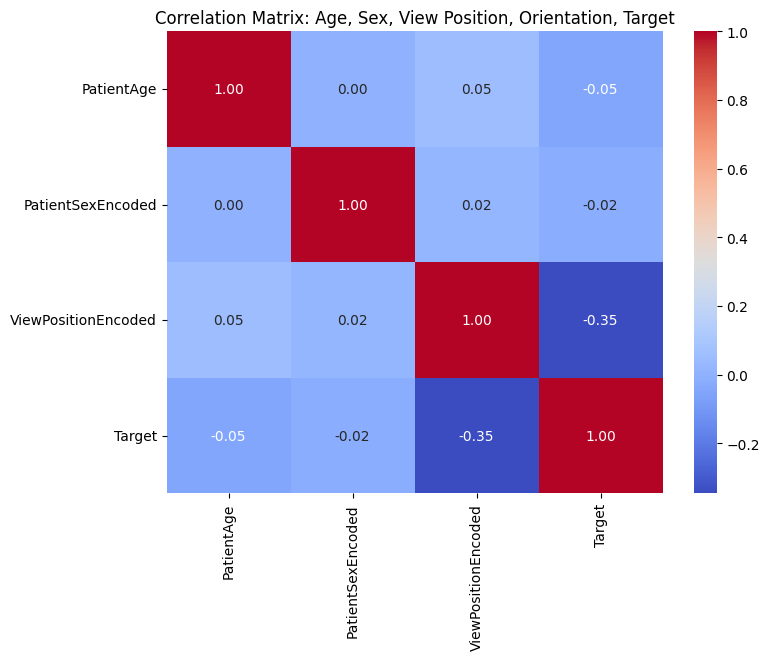

In [363]:
# Produce correlation matrix for some of the dicom tag values that have been found to have multiple values and
# are of interest to our project.

# Clean PatientAge
def parse_patient_age(age_str):
    if isinstance(age_str, str) and age_str.endswith('Y'):
        return int(age_str[:-1])  # Remove 'Y' and convert to int
    return np.nan



# Encode categorical variables
# Sex: 'M' -> 0, 'F' -> 1
df_full['PatientSexEncoded'] = df_full['PatientSex'].map({'M': 0, 'F': 1})

# View Position: create category codes
df_full['ViewPositionEncoded'] = df_full['ViewPosition'].astype('category').cat.codes


# Select the columns for correlation ---
corr_df = df_full[['PatientAge', 'PatientSexEncoded', 'ViewPositionEncoded', 'Target']]

# Calculate correlation matrix
corr_matrix = corr_df.corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix: Age, Sex, View Position, Target')
plt.show()

In [364]:
# View pneumonia rate per view position
view_pneumonia_rate = df_full.groupby('ViewPosition')['Target'].mean()

print(view_pneumonia_rate)

ViewPosition
AP    0.383143
PA    0.092895
Name: Target, dtype: float64


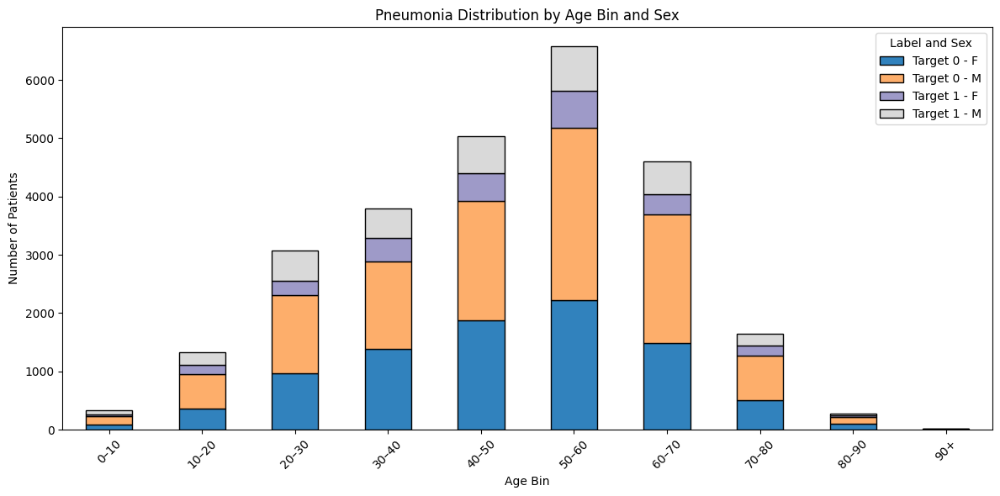

In [365]:
# Create a box plot of pneumonia distribution per gender and age group
# Create age bins
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 120]
labels = ['0–10', '10–20', '20–30', '30–40', '40–50', '50–60', '60–70', '70–80', '80–90', '90+']
df_full['AgeBin'] = pd.cut(df_full['PatientAge'], bins=bins, labels=labels, right=False)

# Group by AgeBin, Sex, and Target
grouped = df_full.groupby(['AgeBin', 'PatientSex', 'Target']).size().reset_index(name='Count')

# Pivot for stacked bar plotting
pivoted = grouped.pivot_table(index='AgeBin', columns=['Target', 'PatientSex'], values='Count', fill_value=0)

# Flatten columns
pivoted.columns = [f'Target {t} - {sex}' for t, sex in pivoted.columns]

# Plot
pivoted.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='tab20c', edgecolor='black')

plt.title('Distribution by Age Bin and Sex')
plt.xlabel('Age Bin')
plt.ylabel('Number of Patients')
plt.xticks(rotation=45)
plt.legend(title='Label and Sex')
plt.tight_layout()
plt.show()

In [1]:
# This list was produced previously through lung segmentation and selection of images with very small lung masks indicating 
# poor image quality

#*********************''
excl_lst = ['809830cd-c757-4e81-abec-0d6d935ae0ce', 'ba221090-4382-4ccf-afc2-cda9af445aa5', '6438d645-6fdb-4fda-8598-a4c1902a33c2', 'b35d57ee-f22b-4c8c-b959-3ee8eecef555', 'f0486970-9fc3-469e-9b80-375b5a04f9ae', '01fa0f5e-00c3-41cb-b5c7-10600c8633ae', 'bc668e08-44be-4aed-aa17-7b321c8e11a5', 'b08e4c8f-0dbf-4878-90f6-82220205f8a1', 'c5371ee3-958d-40de-8359-13c58e0bc071', '4c7afe96-9f99-496f-a4c4-d27a3d76a767', '70d7f4df-5497-4205-a36b-e47b58145fa2', 'b957974c-211b-4f52-86d3-25d18825dfa3', '5e3da45b-f7b6-4948-aad4-7a37cf9cae5b', '335d17b1-bdfb-4939-9dc9-fa93f09648eb', 'bd7b6626-82a0-4410-b96b-3109223128e1', '949d29ea-c8d1-4627-aa46-65aca7112946', '3874e3f6-0c79-4fc1-a874-1d761e475e53', '75431238-8d46-4b70-bbb7-128bd58602cd', '74ef566d-21ce-4b66-b134-a713ca915762', 'f418c86c-13cb-44a4-b090-21030f9fc95e', 'c241425c-418c-4958-8a18-c3425fe03f03', '09bfe52b-201a-435a-b04f-ada40a64b5b5', 'ecb0e8b7-0f0f-40ed-848d-8b070a14bc8c', '66bcb6f8-946f-4f66-8d18-06f17b01d3cd', 'f22a216f-9194-49be-ae18-1c2b09b86de9', '13990031-9dbf-4e03-9505-0f9120bdb166', '3fad6559-5289-4da1-a682-df0c97a08e38', '8af89b60-74e2-4f60-8764-b954598cddc4', '35621d68-0915-463c-b0f8-2365c6e56e11', '4068843a-d393-45cb-9d08-567238cdc6d2', '28b67d93-2432-41e4-9e3b-3d0ba249ad39']

excl_lst.append('fcd6452c-680d-40a6-9fc6-1793eb3ca0a8')
print(excl_lst)

['809830cd-c757-4e81-abec-0d6d935ae0ce', 'ba221090-4382-4ccf-afc2-cda9af445aa5', '6438d645-6fdb-4fda-8598-a4c1902a33c2', 'b35d57ee-f22b-4c8c-b959-3ee8eecef555', 'f0486970-9fc3-469e-9b80-375b5a04f9ae', '01fa0f5e-00c3-41cb-b5c7-10600c8633ae', 'bc668e08-44be-4aed-aa17-7b321c8e11a5', 'b08e4c8f-0dbf-4878-90f6-82220205f8a1', 'c5371ee3-958d-40de-8359-13c58e0bc071', '4c7afe96-9f99-496f-a4c4-d27a3d76a767', '70d7f4df-5497-4205-a36b-e47b58145fa2', 'b957974c-211b-4f52-86d3-25d18825dfa3', '5e3da45b-f7b6-4948-aad4-7a37cf9cae5b', '335d17b1-bdfb-4939-9dc9-fa93f09648eb', 'bd7b6626-82a0-4410-b96b-3109223128e1', '949d29ea-c8d1-4627-aa46-65aca7112946', '3874e3f6-0c79-4fc1-a874-1d761e475e53', '75431238-8d46-4b70-bbb7-128bd58602cd', '74ef566d-21ce-4b66-b134-a713ca915762', 'f418c86c-13cb-44a4-b090-21030f9fc95e', 'c241425c-418c-4958-8a18-c3425fe03f03', '09bfe52b-201a-435a-b04f-ada40a64b5b5', 'ecb0e8b7-0f0f-40ed-848d-8b070a14bc8c', '66bcb6f8-946f-4f66-8d18-06f17b01d3cd', 'f22a216f-9194-49be-ae18-1c2b09b86de9',

In [12]:
# This code shows how many of the patients in the exclusion list (excl_lst) that belong to each gender and viewpositions

test7 = copy.deepcopy(df_full)
print('Distribution of AP/PA in the whole dataset')
print(test7.groupby('ViewPosition')['Unnamed: 0'].count())
filtered = test7[test7['patientId'].isin(excl_lst)]
counts = filtered.groupby('ViewPosition')['Unnamed: 0'].count()
print('Distribution of AP/PA in the dataset for exclusion')
print(counts)

print('Distribution of gender in the whole dataset')
print(test7.groupby('PatientSex')['Unnamed: 0'].count())
filtered = test7[test7['patientId'].isin(excl_lst)]
counts = filtered.groupby('PatientSex')['Unnamed: 0'].count()
print('Distribution of gender in the dataset for exclusion')
print(counts)


Distribution of AP/PA in the whole dataset
ViewPosition
AP    12173
PA    14511
Name: Unnamed: 0, dtype: int64
Distribution of AP/PA in the dataset for exclusion
ViewPosition
AP    31
PA     1
Name: Unnamed: 0, dtype: int64
Distribution of gender in the whole dataset
PatientSex
F    11518
M    15166
Name: Unnamed: 0, dtype: int64
Distribution of gender in the dataset for exclusion
PatientSex
F    17
M    15
Name: Unnamed: 0, dtype: int64


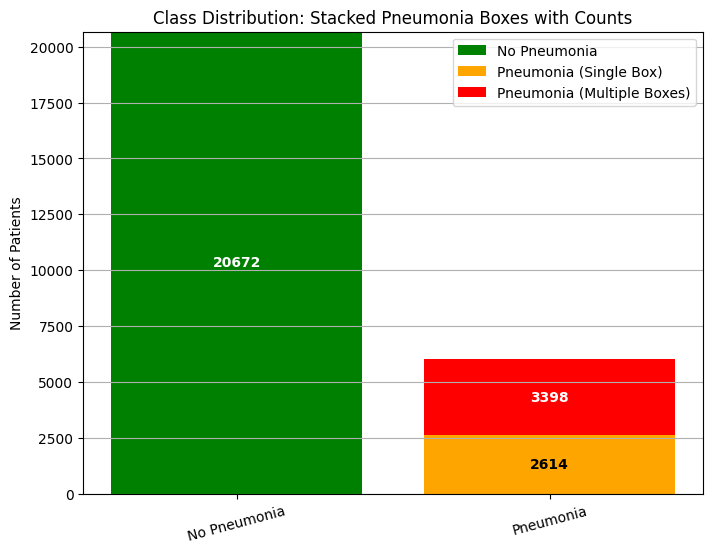

In [16]:
# Create class imbalance visualization

# Unique patient IDs
patient_ids = df_labels['patientId'].unique()

# Separate pneumonia cases
pneumonia_cases = df_labels[df_labels['Target'] == 1]
no_pneumonia_patients = df_labels[df_labels['Target'] == 0]['patientId'].unique()

# Count number of boxes per pneumonia patient
bbox_counts = pneumonia_cases.groupby('patientId').size()

# Initialize counters
no_pneumonia_count = len(no_pneumonia_patients)
single_box_count = 0
multi_box_count = 0

# Count patients with 1 vs multiple pneumonia boxes
for pid, count in bbox_counts.items():
    if count == 1:
        single_box_count += 1
    else:
        multi_box_count += 1

# Set up data for stacked bar
categories = ['No Pneumonia', 'Pneumonia']
no_pneu = [no_pneumonia_count, 0]
single_box = [0, single_box_count]
multi_box = [0, multi_box_count]

# Prepare bottom arrays
single_plus_no = np.array(no_pneu) + np.array(single_box)

# Plot
plt.figure(figsize=(8,6))

# First bar
plt.bar(categories, no_pneu, label='No Pneumonia', color='green')

# Stack single box
plt.bar(categories, single_box, bottom=no_pneu, label='Pneumonia (Single Box)', color='orange')

# Stack multi box
plt.bar(categories, multi_box, bottom=single_plus_no, label='Pneumonia (Multiple Boxes)', color='red')

# Add text labels
for idx, val in enumerate(no_pneu):
    if val > 0:
        plt.text(idx, val/2, str(val), ha='center', va='center', color='white', fontweight='bold')

for idx, val in enumerate(single_box):
    if val > 0:
        plt.text(idx, no_pneu[idx] + val/2, str(val), ha='center', va='center', color='black', fontweight='bold')

for idx, val in enumerate(multi_box):
    if val > 0:
        plt.text(idx, single_plus_no[idx] + val/2, str(val), ha='center', va='center', color='white', fontweight='bold')

# Labels and title
plt.ylabel('Number of Patients')
plt.title('Class Distribution: Stacked Pneumonia Boxes with Counts')
plt.xticks(rotation=15)
plt.legend()
plt.grid(axis='y')

plt.show()


In [241]:
# Show all present dicom tags
def print_dicom_tags(dicom_path):
    """Print all available tags and their values in a DICOM file."""
    dcm = pydicom.dcmread(dicom_path)
    
    print(f"--- DICOM tags for: {dicom_path} ---")
    for elem in dcm.iterall():
        tag = elem.tag
        name = elem.name
        vr = elem.VR  # Value Representation (type of the field, like 'LO', 'CS', 'DA', etc.)
        value = elem.value

        if elem.value not in [None, '', [], b'']:
            print(f"{elem.tag} {elem.name} -- Has Value")
        else:
            print(f"{elem.tag} {elem.name} -- EMPTY")
    for elem in dcm.iterall():
        if elem.tag.is_private:
            print(f"Private tag: {elem.tag} - {elem.name}")

# Example usage:
print_dicom_tags("datasets/rsna-pneumonia/stage_2_train_images/0004cfab-14fd-4e49-80ba-63a80b6bddd6.dcm")

--- DICOM tags for: datasets/rsna-pneumonia/stage_2_train_images/0004cfab-14fd-4e49-80ba-63a80b6bddd6.dcm ---
(0008,0005) Specific Character Set -- Has Value
(0008,0016) SOP Class UID -- Has Value
(0008,0018) SOP Instance UID -- Has Value
(0008,0020) Study Date -- Has Value
(0008,0030) Study Time -- Has Value
(0008,0050) Accession Number -- EMPTY
(0008,0060) Modality -- Has Value
(0008,0064) Conversion Type -- Has Value
(0008,0090) Referring Physician's Name -- EMPTY
(0008,103E) Series Description -- Has Value
(0010,0010) Patient's Name -- Has Value
(0010,0020) Patient ID -- Has Value
(0010,0030) Patient's Birth Date -- EMPTY
(0010,0040) Patient's Sex -- Has Value
(0010,1010) Patient's Age -- Has Value
(0018,0015) Body Part Examined -- Has Value
(0018,5101) View Position -- Has Value
(0020,000D) Study Instance UID -- Has Value
(0020,000E) Series Instance UID -- Has Value
(0020,0010) Study ID -- EMPTY
(0020,0011) Series Number -- Has Value
(0020,0013) Instance Number -- Has Value
(0020,

In [100]:


class LungMaskedXrayDataset(Dataset):
    def __init__(self, image_paths, labels, resize_size=(224, 224)):
        self.image_paths = image_paths
        self.labels = labels
        self.resize_size = resize_size

        # Basic transforms
        self.resize_transform = T.Resize(self.resize_size)
        self.norm_transform = T.Normalize(mean=[0.5], std=[0.5])  # adjust mean/std if different

        # Load the lung segmentation model
        self.lung_segmenter = xrv.models.get_lungs_model()
        self.lung_segmenter.eval()
        for param in self.lung_segmenter.parameters():
            param.requires_grad = False

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Load the image (assuming already tensor [1, H, W])
        img = torch.load(self.image_paths[idx])  # or adjust loading depending on your storage format
        label = self.labels[idx]

        # Resize first
        img = self.resize_transform(img)

        # Prepare for lung segmentation (rescale to [0,1])
        img_for_seg = img.clone()
        img_for_seg = img_for_seg - img_for_seg.min()
        img_for_seg = img_for_seg / (img_for_seg.max() + 1e-8)

        with torch.no_grad():
            lung_mask = self.lung_segmenter(img_for_seg.unsqueeze(0)).squeeze(0)  # [1, H, W] -> [H, W]

        # Threshold lung mask (optional: make binary, e.g., >0.5)
        lung_mask = (lung_mask > 0.5).float()

        # Apply lung mask
        img = img * lung_mask.unsqueeze(0)  # [1, H, W] * [1, H, W]

        # Normalize afterwards
        img = self.norm_transform(img)

        return img, label

In [ ]:

# Assuming MaskGenerationDataset class is already defined 

# 1. Paths and folders
image_dir = "datasets/rsna-pneumonia/stage_2_train_pt_images"
save_dir_lung = "datasets/rsna-pneumonia/masks/lung_masks"
save_dir_bbox = "datasets/rsna-pneumonia/masks/bbox_masks"

# Create folders if they don't exist
os.makedirs(save_dir_lung, exist_ok=True)
os.makedirs(save_dir_bbox, exist_ok=True)

# Create dictionary with key PatientId and value bboxes
# Create bbox_dict from df_full
bbox_dict = {}

for idx, row in df_full.iterrows():
    patient_id = row['patientId']
    target = row['Target']

    if target == 1:  # Only if pneumonia is present
        bboxes = row['bbox']  # This should already be a list of [x, y, w, h]

        # If there are any bboxes (should be a list)
        if isinstance(bboxes, list) and len(bboxes) > 0:
            bbox_dict[patient_id] = bboxes
print('bbox-dictionary created')

# 2. Create your dataset
dataset = MaskGenerationDataset(
    image_dir=image_dir,
    bbox_dict=bbox_dict,          # your dictionary: patient_id -> list of bboxes
    contrast_enhance=True,        # yes, enhance contrast before lung segmentation
    low_percentile=4,
    high_percentile=96
)
print('dataset created')
# 3. Create a DataLoader
loader = DataLoader(dataset, batch_size=1, shuffle=False)
print('loader created')
index = 1
# 4. Loop through and save masks
for lung_mask, bbox_mask, patient_id in loader:
    if index % 100 == 0:
        print(index)
    patient_id = patient_id[0]  # Because batch_size=1
    index += 1
    # Remove batch dimension
    lung_mask = lung_mask.squeeze(0)
    bbox_mask = bbox_mask.squeeze(0)

    # Save lung mask
    lung_path = os.path.join(save_dir_lung, f"{patient_id}_lung_mask.pt")
    torch.save(lung_mask, lung_path)

    # Save bbox mask
    bbox_path = os.path.join(save_dir_bbox, f"{patient_id}_bbox_mask.pt")
    torch.save(bbox_mask, bbox_path)

print("All masks saved successfully!")

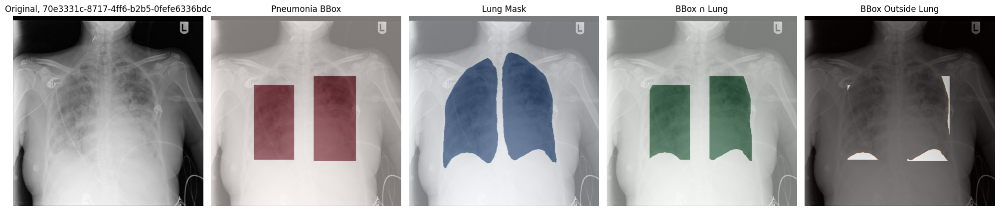

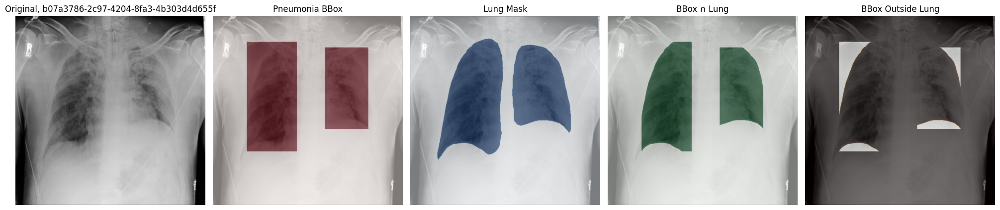

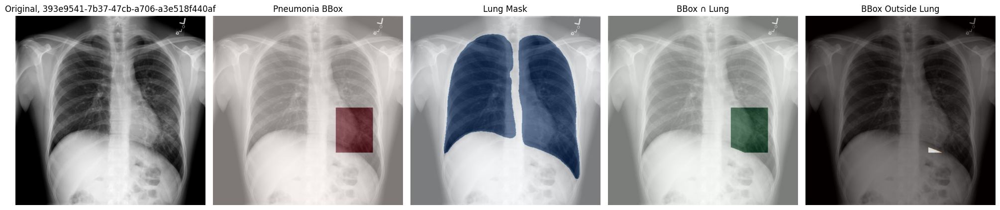

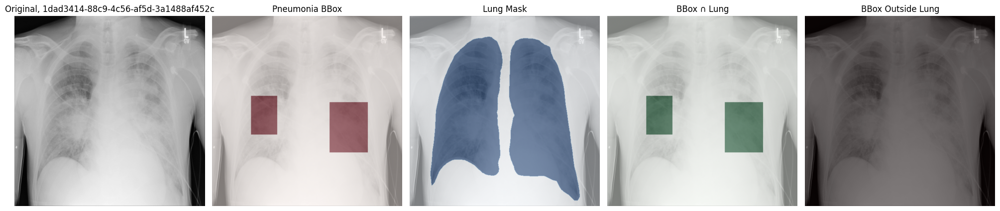

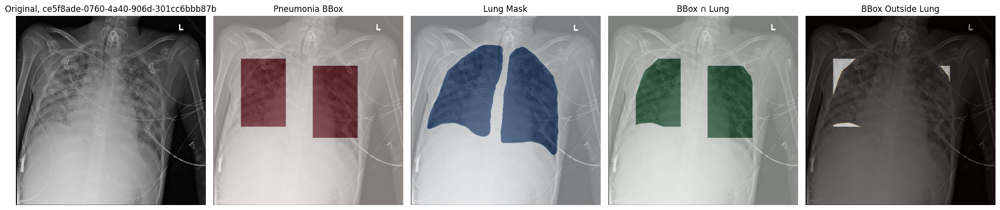

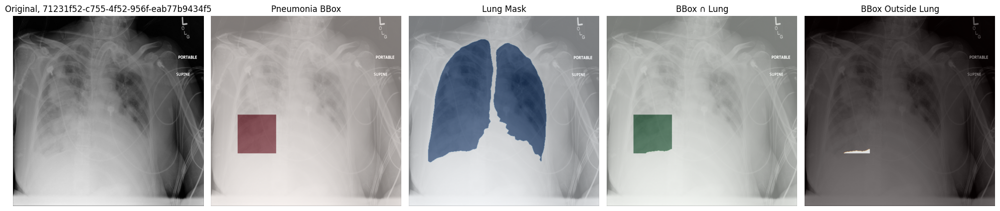

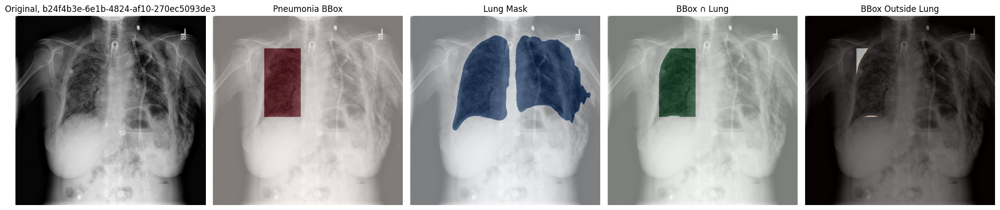

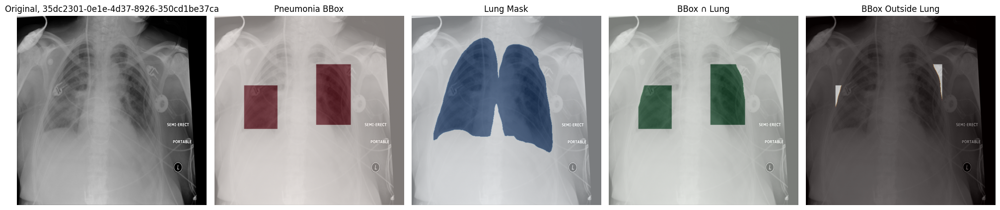

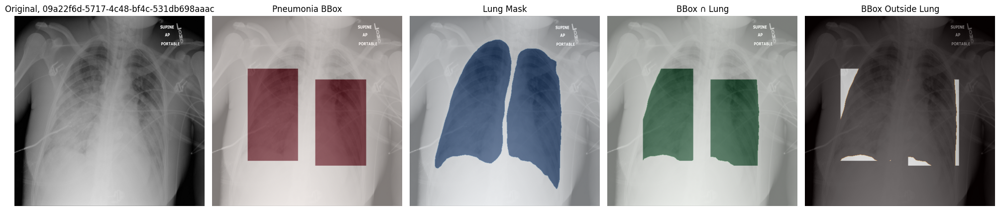

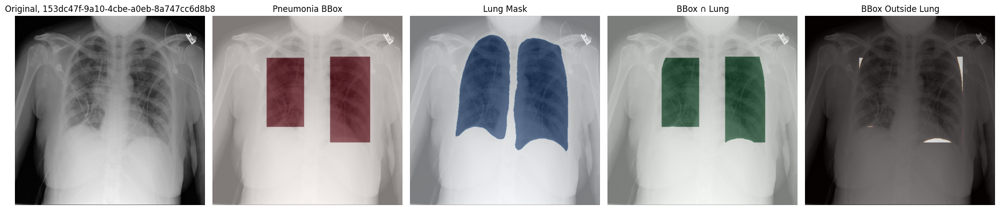

In [433]:
# Visualize a random selection of patients with generated lung masks, bounding box masks and the 
# intersection and difference between the two

# Paths
base_path = "datasets/rsna-pneumonia"
bbox_path = os.path.join(base_path, "masks/bbox_masks")
lung_path = os.path.join(base_path, "masks/lung_masks")
original_path = os.path.join(base_path, "stage_2_train_pt_images")
# Load label dataframe
#df_labels = pd.read_csv(os.path.join(base_path, "stage_2_train_labels.csv"))
positive_ids = set(df_labels[df_labels["Target"] == 1]["patientId"])

# Helper to extract ID from filenames like '123_bbox_mask.pt'
def extract_id(filename):
    return filename.split("_")[0]

# Get bbox and lung mask files
bbox_files = [f for f in os.listdir(bbox_path) if f.endswith(".pt")]
lung_files = [f for f in os.listdir(lung_path) if f.endswith(".pt")]

# Find common valid IDs with positive label
bbox_ids = {extract_id(f) for f in bbox_files}
lung_ids = {extract_id(f) for f in lung_files}
valid_ids = list(bbox_ids & lung_ids & positive_ids)

# Show 3 random examples
n_examples = 10
for i in range(n_examples):
    sample_id = random.choice(valid_ids)

    # Construct filenames
    original_file = sample_id + ".pt"
    bbox_file = sample_id + "_bbox_mask.pt"
    lung_file = sample_id + "_lung_mask.pt"

    # Load tensors
    original_img = torch.load(os.path.join(original_path, original_file))
    bbox_tensor = torch.load(os.path.join(bbox_path, bbox_file)).float()
    lung_tensor = torch.load(os.path.join(lung_path, lung_file)).float()

    # Normalize if needed
    if bbox_tensor.max() > 1:
        bbox_tensor /= 255
    if lung_tensor.max() > 1:
        lung_tensor /= 255

    # Compute masks
    intersection = bbox_tensor * lung_tensor
    violation = bbox_tensor * (1 - lung_tensor)

    # Plot
    fig, axs = plt.subplots(1, 5, figsize=(20, 5))
    axs[0].imshow(original_img.squeeze(), cmap="gray")
    axs[0].set_title(f"Original, {sample_id}")

    axs[1].imshow(original_img.squeeze(), cmap="gray")
    axs[1].imshow(bbox_tensor, cmap="Reds", alpha=0.5)
    axs[1].set_title("Pneumonia BBox")

    axs[2].imshow(original_img.squeeze(), cmap="gray")
    axs[2].imshow(lung_tensor, cmap="Blues", alpha=0.5)
    axs[2].set_title("Lung Mask")

    axs[3].imshow(original_img.squeeze(), cmap="gray")
    axs[3].imshow(intersection, cmap="Greens", alpha=0.5)
    axs[3].set_title("BBox ∩ Lung")

    axs[4].imshow(original_img.squeeze(), cmap="gray")
    axs[4].imshow(violation, cmap="hot", alpha=0.5)
    axs[4].set_title("BBox Outside Lung")

    for ax in axs:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
# Create a list, excl_lst, with patient IDs to exclude from training

# Check if excl_lst already exists, otherwise initialize emtpy list
try:
    excl_lst
except NameError:
    excl_lst = []
# Directory paths
mask_dir = "datasets/rsna-pneumonia/masks/lung_masks_npz"
dicom_dir = "datasets/rsna-pneumonia/stage_2_train_images"

# Thresholds for area fraction
min_frac = 0.03
max_frac = 0.8

# List all lung-mask .npz files
mask_files = [f for f in os.listdir(mask_dir) if f.endswith("_lung_mask.npz")]

for fname in mask_files:
    pid = fname.replace("_lung_mask.npz", "")
    if pid not in excl_lst:
        mask_path = os.path.join(mask_dir, fname)
        dicom_path = os.path.join(dicom_dir, f"{pid}.dcm")
        
        # Load and normalize lung mask
        npz = np.load(mask_path)
        arr = npz[npz.files[0]].astype(np.float32)
        if arr.max() > 1.0:
            arr = arr / arr.max()
        mask_bin = arr > 0.5
        
        # Compute area fraction
        area_frac = mask_bin.sum() / mask_bin.size
        
        # Show only out-of-range masks
        if area_frac < min_frac or area_frac > max_frac:
            # Load and preprocess DICOM image
            dcm = pydicom.dcmread(dicom_path)
            img = dcm.pixel_array.astype(np.float32)
            img = np.clip(img, -1024, 1024)
            img = (img + 1024) / 2048  # normalize to [0,1]
            
            # Plot DICOM and mask side by side
            fig, axes = plt.subplots(1, 2, figsize=(8, 4))
            axes[0].imshow(img, cmap='gray')
            axes[0].set_title(f"{pid}.dcm")
            axes[0].axis('off')
            
            axes[1].imshow(mask_bin, cmap='gray')
            axes[1].set_title(f"{fname}\nArea frac = {area_frac:.3f}")
            axes[1].axis('off')
            
            plt.tight_layout()
            plt.show()
            # Let user choose whether to enter example into exclusion list
            excl = input('Exclude? (y/n)')
            if excl == 'y':
                excl_lst.append(pid)
print('Done.')